<a href="https://colab.research.google.com/github/hseguraq/Proyecto-Integrador-ITESM-MNAV/blob/main/Avance3_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Modelo Base**
# **Radiografías de Tórax**
# ITESM - MNA V

## Proyecto Integrador - TC5035.10

## Profesora: Dra. Grettel Barceló Alonso


### Equipo 19

Héctor Segura Quintanilla (A01154108)

Julio César García Escoto (A01795050)

Francisco Medellín Zertuche (A01794044)


# Introducción

A continuación se presenta el flujo completo de procesamiento, entrenamiento y evaluación de un modelo de clasificación de radiografías torácicas enfocado en la detección de cardiopatías congénitas. El propósito central es obtener un modelo base que sirva de referencia para seleccionar más adelante la mejor arquitectura.

A lo largo del cuaderno se realiza la carga y preprocesamiento del conjunto de datos, que incluye pasos como conversión a escala de grises, normalización y preparación de etiquetas. Posteriormente, se implementa una arquitectura basada en EfficientNet utilizando PyTorch, optimizada para trabajar con imágenes médicas, y se entrena el modelo aplicando estrategias de regularización y ajuste dinámico de la tasa de aprendizaje.

Finalmente, se evalúa el rendimiento del modelo mediante métricas relevantes para el contexto clínico —como precisión, sensibilidad, especificidad, valor predictivo positivo/negativo y AUC— y se visualizan los resultados a través de matrices de confusión y reportes de clasificación, con el objetivo de analizar su capacidad diagnóstica y potencial de aplicación en entornos médicos.



# Instalación de librerías

In [2]:
!pip install -q scikit-image
!pip install -q ImageHash

In [3]:
import os
import random
import math
import shutil
import multiprocessing
from datetime import datetime
from glob import glob
from collections import Counter
from concurrent.futures import ProcessPoolExecutor, as_completed
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Data Handling & Visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from tqdm.auto import tqdm # Mantener tqdm.auto para notebooks
from IPython.display import Image, display

# Image Processing (PIL, OpenCV)
from PIL import Image
from PIL.Image import Resampling
import cv2
import imagehash

# Machine Learning & Deep Learning
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
import torch
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision import models
from keras.utils import to_categorical # Añadido ya que se usa para Y_encoded

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# Metrics
from sklearn.metrics import (confusion_matrix, classification_report,
                             roc_auc_score, average_precision_score)

# Multiprocessing pipeline
import multiprocessing
from concurrent.futures import ProcessPoolExecutor, as_completed
from datetime import datetime
from tensorflow.keras.utils import to_categorical

In [4]:
# CREAMOS UNA CLASE QUE NOS AYUDARA A CARGAR LOS DATOS PARA LOS MODELOS (UTILIZA EL FORMATO DE DATASET GENERADO EN EL PUNTO 5)
# ESTA CLASE ADAPTA LAS RUTAS RELATIVAS A RUTAS ABSOLUTAS DEL ENTORNO DE EJECUCIÓN
class DatasetLoader:
    """
    Carga y prepara los DataFrames de entrenamiento, validación y prueba
    desde archivos CSV contenidos en una carpeta específica.
    """

    def __init__(self, dataset_path: str):
        """
        Inicializa el cargador de datasets con la ruta base de la carpeta.

        Args:
            dataset_path (str): La ruta absoluta o relativa a la carpeta
                                 que contiene los archivos CSV (train.csv,
                                 val.csv, test.csv).
        """
        # Normaliza la ruta y la guarda
        self.dataset_path = os.path.abspath(dataset_path)
        print(f"Ruta base del dataset establecida: {self.dataset_path}")

    def _load_and_process_df(self, filename: str) -> tuple[pd.DataFrame, pd.DataFrame]:
        """
        Método interno para cargar un CSV específico, preprocesar las rutas
        y dividir el DataFrame en X (rutas de imagen) y Y (etiquetas).

        Args:
            filename (str): Nombre del archivo CSV (ej. 'train.csv').

        Returns:
            tuple[pd.DataFrame, pd.DataFrame]: Una tupla con (X, Y) DataFrames.
        """
        file_path = os.path.join(self.dataset_path, filename)

        if not os.path.exists(file_path):
            raise FileNotFoundError(f"El archivo '{filename}' no se encontró en la ruta: {file_path}")

        df = pd.read_csv(file_path)

        # Verificar que las columnas 'image_path' y 'label' existan
        if 'image_path' not in df.columns or 'label' not in df.columns:
            raise ValueError(f"El archivo '{filename}' debe contener las columnas 'image_path' y 'label'.")

        print(f"Archivo {filename} leído. Filas: {len(df)}")

        df['image_path'] = df['image_path'].apply(
            lambda x: os.path.join(self.dataset_path, x)
        )

        # Dividir el DataFrame
        # X: solo la columna 'image_path'
        X = df[['image_path']]
        # Y: solo la columna 'label'
        Y = df[['label']]

        return X, Y


    def get_dataframes(self) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
        """
        Carga y procesa los tres archivos CSV (train, val, test) y regresa
        seis DataFrames (X_train, X_val, X_test, Y_train, Y_val, Y_test).

        Returns:
            tuple: (x_train, x_val, x_test, y_train, y_val, y_test)
        """
        print("\nIniciando carga y preprocesamiento de DataFrames...")

        # Cargar y procesar el conjunto de entrenamiento
        x_train, y_train = self._load_and_process_df('train.csv')

        # Cargar y procesar el conjunto de validación
        x_val, y_val = self._load_and_process_df('val.csv')

        # Cargar y procesar el conjunto de prueba
        x_test, y_test = self._load_and_process_df('test.csv')

        print("\nCarga de DataFrames completada exitosamente.")

        # Regresar los 6 DataFrames
        return x_train, x_val, x_test, y_train, y_val, y_test

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# CARGAMOS LOS DATASET GENERADOS EN EL PUNTO 5 A UNA VARIABLE (SE CARGAN DESDE EL ALMACENAMIENTO PARA NO RECREAR LOS SPLIT EN CADA EJECUCIÓN)
dt_loader = DatasetLoader('/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/dataset_seg')
x_train_og, x_val_og, x_test_og, y_train_og, y_val_og, y_test_og = dt_loader.get_dataframes()

# dt_loader_crop = DatasetLoader('/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/dataset_crop')
# x_train_crop, x_val_crop, x_test_crop, y_train_crop, y_val_crop, y_test_crop = dt_loader_crop.get_dataframes()

Ruta base del dataset establecida: /content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/dataset_seg

Iniciando carga y preprocesamiento de DataFrames...
Archivo train.csv leído. Filas: 579
Archivo val.csv leído. Filas: 124
Archivo test.csv leído. Filas: 125

Carga de DataFrames completada exitosamente.


# Definición de clases y funciones

In [7]:
class ImageVersioner:
    """
    Clase para crear y ejecutar un pipeline de procesamiento de imágenes
    unificada y optimizada con paralelismo. VERSIÓN CORREGIDA.
    """
    def __init__(self, initial_params=None, stepVersioning=True, max_workers=multiprocessing.cpu_count()):
        self.initial_params = initial_params if initial_params is not None else {}
        self.step_versioning = stepVersioning
        self.pipeline_steps = []
        self.max_workers = max_workers
        self.class_mapping = {
            'Normal': 0, 'ASD': 1, 'PDA': 2, 'VSD': 3
        }
        self.num_classes = len(self.class_mapping)
        self.inverse_class_mapping = {v: k for k, v in self.class_mapping.items()}

    def createPipeline(self, steps: list):
        self.pipeline_steps = steps
        print(f"Pipeline creado con {len(steps)} pasos.")

    @staticmethod
    def _save_versioned_image_static(image, base_path, step_name, original_filename, log_enabled):
        step_dir = os.path.join(base_path, step_name)
        os.makedirs(step_dir, exist_ok=True)
        save_path = os.path.join(step_dir, original_filename)
        image.save(save_path)
        if log_enabled:
            print(f"  -> Imagen guardada en: {save_path}")

    @staticmethod
    def _process_static(row_data, index, pipeline_steps, initial_params, base_path, step_versioning, log): # <--- CAMBIO CLAVE: Recibe el índice
        """
        Función de procesamiento estática. Retorna una tupla (índice, PIL.Image).
        """
        image_path = row_data['image_path']
        original_filename = os.path.basename(image_path)
        if log:
            print(f"\nProcesando imagen: {original_filename}")
        try:
            current_image = Image.open(image_path).convert("RGB")
            if step_versioning:
                ImageVersioner._save_versioned_image_static(current_image, base_path, "00_original", original_filename, log)
            for step_name, step_function in pipeline_steps:
                current_image = step_function(current_image, **initial_params)
                if step_versioning:
                    ImageVersioner._save_versioned_image_static(current_image, base_path, step_name, original_filename, log)

            # <--- CAMBIO CLAVE: Retorna el índice junto con la imagen
            return (index, current_image)
        except Exception as e:
            tqdm.write(f"Error procesando {original_filename}: {e}")
            return (index, None) # <--- CAMBIO CLAVE: Retorna el índice incluso en error

    def pipeline(self, data_df: pd.DataFrame, versioning_root_path: str, label: str, log: bool = False) -> np.ndarray:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        version_folder = f"{label}_{timestamp}"
        base_path = os.path.join(versioning_root_path, version_folder)
        os.makedirs(base_path, exist_ok=True)
        print(f"Iniciando pipeline y versionado en: {base_path} con {self.max_workers} procesos paralelos.")

        # <--- CAMBIO CLAVE: Guardará tuplas (índice, imagen)
        processing_results = []

        with ProcessPoolExecutor(max_workers=self.max_workers) as executor:
            futures = [
                executor.submit(self._process_static,
                                row,
                                index, # <--- CAMBIO CLAVE: Pasa el índice original
                                self.pipeline_steps,
                                self.initial_params,
                                base_path,
                                self.step_versioning,
                                log)
                for index, row in data_df.iterrows()
            ]

            iterator = tqdm(as_completed(futures), total=len(futures), desc=f"Procesando {label}", disable=log)

            for future in iterator:
                result_tuple = future.result()
                if result_tuple[1] is not None: # Checa si la imagen no es None
                    processing_results.append(result_tuple)

            if not log:
                iterator.close()

        # <--- CAMBIO CLAVE: Reordenar los resultados según el índice original
        print("\nReordenando resultados...")
        processing_results.sort(key=lambda x: x[0])

        # <--- CAMBIO CLAVE: Extraer solo las imágenes, ahora en el orden correcto
        final_images_pil_list = [img for idx, img in processing_results]

        print("Convirtiendo a tensor y normalizando...")
        if not final_images_pil_list:
            print("Advertencia: No se procesó ninguna imagen.")
            return np.array([])

        x_np_list = [np.array(img, dtype='uint8') for img in final_images_pil_list]
        x_tensor = np.stack(x_np_list, axis=0)

        if len(x_tensor.shape) == 3:
            x_tensor = np.expand_dims(x_tensor, axis=-1)

        x_normalized = x_tensor.astype('float32') / 255.0

        print(f"Pipeline finalizado. Tensor X generado con forma: {x_normalized.shape}")
        return x_normalized

    def transform_y_encoded(self, y_df: pd.DataFrame) -> np.ndarray:
        if 'label' not in y_df.columns:
            raise ValueError("El DataFrame de etiquetas debe contener la columna 'label'.")
        y_integers = y_df['label'].map(self.class_mapping)
        if y_integers.isnull().any():
            unmapped_labels = y_df['label'][y_integers.isnull()].unique()
            raise ValueError(f"Se encontraron etiquetas no definidas en el mapeo: {unmapped_labels}")
        y_encoded = to_categorical(y_integers, num_classes=self.num_classes)
        print(f"Etiquetas codificadas generadas con forma: {y_encoded.shape}")
        return y_encoded

In [8]:
# Funciones Auxiliares

def _pil_to_cv2_gray(image_pil):
    """Convierte PIL (L o RGB) a NumPy/CV2 en escala de grises."""
    img_gray_pil = image_pil.convert('L')
    return np.array(img_gray_pil)

def _cv2_gray_to_pil(img_cv):
    """Convierte NumPy/CV2 (escala de grises) a PIL."""
    return Image.fromarray(img_cv)

#-----FUNCIONES VERSIONABLES-------

def step_convert_to_grayscale(image_pil, **kwargs):
    """0. Convierte la imagen a escala de grises (modo 'L' en PIL)."""
    return image_pil.convert('L')


def step_remove_marker_inpaint(image_pil, **kwargs):
    """1. Quita marcadores circulares mediante detección Hough e inpainting."""

    img_gray = _pil_to_cv2_gray(image_pil)

    # Lógica original de remove_marker_inpaint (simplificada para el pipeline)
    g = cv2.medianBlur(img_gray, 5)
    circles = cv2.HoughCircles(
        g, cv2.HOUGH_GRADIENT, dp=1.2, minDist=kwargs.get('minDist', 60),
        param1=kwargs.get('param1', 120), param2=kwargs.get('param2', 35),
        minRadius=kwargs.get('minRadius', 10), maxRadius=kwargs.get('maxRadius', 60)
    )
    mask = np.zeros_like(img_gray, dtype=np.uint8)

    if circles is not None:
        circles = np.uint16(np.around(circles[0]))
        h, w = img_gray.shape
        # Usamos el parámetro configurable 'head_frac' para el límite vertical si existe
        vertical_limit = int(h * kwargs.get('marker_v_limit', 0.45))

        for x, y, r in circles:
            if y < vertical_limit:
                cv2.circle(mask, (x, y), int(r * kwargs.get('marker_scale', 1.25)), 255, -1)

    if mask.any():
        final_img_cv = cv2.inpaint(img_gray, mask, 3, cv2.INPAINT_TELEA)
    else:
        final_img_cv = img_gray.copy()

    return _cv2_gray_to_pil(final_img_cv)


def step_crop_and_resize(image_pil, **kwargs):
    """
    2. Segmenta tórax, calcula BBox, recorta cabeza/abdomen y aplica fit-to-square.
    Esta función agrupa los sub-pasos: thorax_mask, bbox_from_mask, trim_head_abdomen,
    crop_to_bbox, y fit_to_square.
    """

    img_gray = _pil_to_cv2_gray(image_pil)
    no_marker = img_gray # Asumimos que esta imagen ya fue limpiada en un paso anterior
    h, w = img_gray.shape


    def _fit_to_square(img_in, size=kwargs.get('size', 320), pad_mode=kwargs.get('pad_mode', "median")):
        """Redimensiona con aspecto y centra en lienzo cuadrado."""
        h_in, w_in = img_in.shape[:2]
        if h_in == 0 or w_in == 0:
             return np.zeros((size, size), dtype=img_in.dtype) # Devuelve negro si está vacío

        scale = min(size / w_in, size / h_in)
        nw, nh = int(round(w_in * scale)), int(round(h_in * scale))

        interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
        resized = cv2.resize(img_in, (nw, nh), interpolation=interp)

        canvas = np.zeros((size, size), dtype=img_in.dtype) # Inicializa a negro (constant)

        if pad_mode == "median":
            # Usar la mediana del array redimensionado
            fill = int(np.median(resized))
            canvas.fill(fill)

        # Colocar centrado
        top  = (size - nh) // 2
        left = (size - nw) // 2
        canvas[top:top+nh, left:left+nw] = resized

        # (Lógica de 'replicate' omitida por brevedad, pero puedes incluirla aquí)

        return canvas

    final_img_cv = _fit_to_square(img_gray)

    # --- 7. Conversión final y Retorno ---
    return _cv2_gray_to_pil(final_img_cv)


# Procesamiento de datos

In [9]:

transformation_steps = [
    ("0_grayscale_convert", step_convert_to_grayscale),
    ("2_crop_and_resize", step_crop_and_resize),
]

initial_params = {
    # Parámetros de step_remove_marker_inpaint
    'minDist': 60,
    'param2': 35,
    'marker_v_limit': 0.45,
    'marker_scale': 1.25,

    # Parámetros de step_crop_and_resize
    'bbox_tighten': 0.02,
    'shrink_frac': 0.10,
    'head_frac': 0.1,
    'abdomen_frac': 0.20,
    'size': 320,
    'pad_mode': 'median',
}


# Inicialización y Asignación del Pipeline

# Inicializamos la clase, habilitando el versionado de cada paso
imv = ImageVersioner(
    initial_params=initial_params,
    stepVersioning=False
)

# Asignamos las funciones al pipeline interno
imv.createPipeline(transformation_steps)

# Ejecución del Pipeline y Generación de Tensores X Normalizados

print("INICIANDO PROCESAMIENTO DE IMÁGENES (GENERACIÓN DE X)")

# X_train: Ejecuta, versiona los resultados y devuelve un array (N, 320, 320, 1) normalizado [0, 1].
X_train_normalized = imv.pipeline(
    data_df=x_train_og,
    versioning_root_path='DataVersioning_Output',
    label='TrainOG',
    log=False
)

# X_test
X_test_normalized = imv.pipeline(
    data_df=x_test_og,
    versioning_root_path='DataVersioning_Output',
    label='TestOG',
    log=False
)

# X_val
X_val_normalized = imv.pipeline(
    data_df=x_val_og,
    versioning_root_path='DataVersioning_Output',
    label='ValOG',
    log=False
)

# Codificación de Etiquetas (Generación de Tensores Y Codificados)

print("INICIANDO CODIFICACIÓN DE ETIQUETAS (GENERACIÓN DE Y)")
# Y_train: Convierte el DataFrame de etiquetas a One-Hot Encoding.
Y_train_encoded = imv.transform_y_encoded(y_train_og)

# Y_test
Y_test_encoded = imv.transform_y_encoded(y_test_og)

# Y_val
Y_val_encoded = imv.transform_y_encoded(y_val_og)


# Resultados Listos para el Modelo

print("RESUMEN DE TENSORES LISTOS")
print(f"X_train (imágenes normalizadas): {X_train_normalized.shape}")
print(f"Y_train (etiquetas codificadas): {Y_train_encoded.shape}")
print(f"X_val   (imágenes normalizadas): {X_val_normalized.shape}")
print(f"Y_val   (etiquetas codificadas): {Y_val_encoded.shape}")
print(f"X_test  (imágenes normalizadas): {X_test_normalized.shape}")
print(f"Y_test  (etiquetas codificadas): {Y_test_encoded.shape}")



Pipeline creado con 2 pasos.
INICIANDO PROCESAMIENTO DE IMÁGENES (GENERACIÓN DE X)
Iniciando pipeline y versionado en: DataVersioning_Output/TrainOG_20251013_233712 con 2 procesos paralelos.


Procesando TrainOG:   0%|          | 0/579 [00:00<?, ?it/s]


Reordenando resultados...
Convirtiendo a tensor y normalizando...
Pipeline finalizado. Tensor X generado con forma: (579, 320, 320, 1)
Iniciando pipeline y versionado en: DataVersioning_Output/TestOG_20251013_234124 con 2 procesos paralelos.


Procesando TestOG:   0%|          | 0/125 [00:00<?, ?it/s]


Reordenando resultados...
Convirtiendo a tensor y normalizando...
Pipeline finalizado. Tensor X generado con forma: (125, 320, 320, 1)
Iniciando pipeline y versionado en: DataVersioning_Output/ValOG_20251013_234218 con 2 procesos paralelos.


Procesando ValOG:   0%|          | 0/124 [00:00<?, ?it/s]


Reordenando resultados...
Convirtiendo a tensor y normalizando...
Pipeline finalizado. Tensor X generado con forma: (124, 320, 320, 1)
INICIANDO CODIFICACIÓN DE ETIQUETAS (GENERACIÓN DE Y)
Etiquetas codificadas generadas con forma: (579, 4)
Etiquetas codificadas generadas con forma: (125, 4)
Etiquetas codificadas generadas con forma: (124, 4)
RESUMEN DE TENSORES LISTOS
X_train (imágenes normalizadas): (579, 320, 320, 1)
Y_train (etiquetas codificadas): (579, 4)
X_val   (imágenes normalizadas): (124, 320, 320, 1)
Y_val   (etiquetas codificadas): (124, 4)
X_test  (imágenes normalizadas): (125, 320, 320, 1)
Y_test  (etiquetas codificadas): (125, 4)


# Entrenamiento con EfficientNet

## Justificación del modelo

El uso de EfficientNet en este proyecto se justifica por su capacidad de ofrecer un equilibrio excepcional entre precisión, eficiencia computacional y capacidad de generalización, factores esenciales cuando se trabaja con conjuntos de datos médicos limitados y sensibles como radiografías para la detección de cardiopatías congénitas. Gracias a su diseño basado en compound scaling, EfficientNet optimiza simultáneamente la profundidad, el ancho y la resolución del modelo, permitiendo que arquitecturas relativamente ligeras logren un rendimiento competitivo frente a modelos mucho más grandes. Además, el uso de pesos preentrenados en ImageNet proporciona una base sólida para el aprendizaje transferido, aprovechando representaciones visuales generales que resultan útiles incluso en dominios médicos distintos.

La adaptación de la primera capa convolucional para trabajar con imágenes en escala de grises y la personalización de la cabeza de clasificación permiten al modelo integrarse perfectamente con nuestro pipeline, conservando el conocimiento adquirido en el preentrenamiento sin introducir redundancia. Esta modificación, junto con el uso de técnicas de regularización como dropout, contribuye a reducir el sobreajuste y a mejorar la capacidad del modelo para identificar patrones sutiles en imágenes médicas. En conjunto, estas características hacen de EfficientNet una elección sólida y estratégica para abordar un problema clínico complejo con recursos computacionales moderados y datos limitados, garantizando un equilibrio adecuado entre rendimiento, interpretabilidad y escalabilidad.

In [10]:
history_crop = {
    "train_loss": [], "train_acc": [], "train_top2": [],
    "val_loss":   [], "val_acc":   [], "val_top2":   [],
    "lrs": []  # per-batch LR track (for OneCycle)
}

In [11]:
import numpy as np
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from torch.cuda.amp import autocast, GradScaler
from torchvision import transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Datos: X_*_normalized (N,320,320,1) en [0,1]; Y_*_encoded one-hot (N,4)
num_classes = Y_train_encoded.shape[1]
y_train_idx = Y_train_encoded.argmax(1).astype(np.int64)
y_val_idx   = Y_val_encoded.argmax(1).astype(np.int64)
y_test_idx  = Y_test_encoded.argmax(1).astype(np.int64)

# Normalización por dataset (rápida): media y std del canal gris
def chan_stats(x):
    m = float(x.mean()); s = float(x.std() + 1e-8)
    return m, s
mean_tr, std_tr = chan_stats(X_train_normalized[..., 0])
print(f"Dataset norm: mean={mean_tr:.4f}, std={std_tr:.4f}")

train_transforms = transforms.Compose([
    transforms.ToPILImage(), # Necesario para que las transformaciones de PIL funcionen
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05)), # Rotación de +/- 10 grados, traslación del 5%
    transforms.ToTensor(), # Convierte de nuevo a tensor
])

# Transformaciones para validación/prueba (solo convertir a tensor)
# No queremos aumentar estos datos para tener una evaluación consistente
val_test_transforms = transforms.Compose([
    transforms.ToTensor(),
])

class NumpyGrayDataset(Dataset):
    def __init__(self, x_nhwc, y_idx, mean, std):
        self.x = np.transpose(x_nhwc, (0,3,1,2)).astype(np.float32, copy=False)  # NCHW (N,1,320,320)
        # normalizar a (x - mean)/std
        self.x = (self.x - mean) / std
        self.y = y_idx.astype(np.int64)
    def __len__(self): return self.x.shape[0]
    def __getitem__(self, i):
        return torch.from_numpy(self.x[i]), torch.tensor(self.y[i])

# 2. Modificar la clase Dataset para aceptar las transformaciones
class NumpyGrayDataset(Dataset):
    def __init__(self, x_nhwc, y_idx, mean, std, transform=None): # Añadimos 'transform'
        self.x = x_nhwc.astype(np.uint8) # Deberían ser enteros de 0-255 ANTES de normalizar
        self.y = y_idx.astype(np.int64)
        self.mean = mean
        self.std = std
        self.transform = transform # Guardar el objeto de transformación

    def __len__(self):
        return self.x.shape[0]
    def __getitem__(self, i):
        image = self.x[i] # Imagen como (H, W, C)
        if self.transform:
            image = self.transform(image)
        else:
            image = torch.from_numpy(np.transpose(image, (2,0,1)).astype(np.float32))
        normalizer = transforms.Normalize(mean=[self.mean], std=[self.std])
        image = normalizer(image)
        return image, torch.tensor(self.y[i])

X_train_uint8 = (X_train_normalized * 255).astype(np.uint8)
X_val_uint8 = (X_val_normalized * 255).astype(np.uint8)
X_test_uint8 = (X_test_normalized * 255).astype(np.uint8)

BATCH = 64
train_dataset = NumpyGrayDataset(X_train_uint8, y_train_idx, mean_tr, std_tr, transform=train_transforms)
val_dataset = NumpyGrayDataset(X_val_uint8, y_val_idx, mean_tr, std_tr, transform=val_test_transforms)
test_dataset = NumpyGrayDataset(X_test_uint8, y_test_idx, mean_tr, std_tr, transform=val_test_transforms)

dl_train = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=True)
dl_val = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)
dl_test = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)

# Modelo:  EfficientNet
class EfficientNetGray(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        # Cargar el modelo EfficientNet-B2 con pesos pre-entrenados
        weights = models.EfficientNet_B2_Weights.IMAGENET1K_V1 if pretrained else None
        m = models.efficientnet_b2(weights=weights)

        # Guardar los pesos de la primera capa convolucional
        original_conv_weights = m.features[0][0].weight.clone()

        # Adaptar la primera capa para aceptar 1 canal (escala de grises)
        m.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)

        # Promediar los pesos RGB para inicializar la nueva capa
        if pretrained:
            m.features[0][0].weight.data = original_conv_weights.mean(dim=1, keepdim=True)

        # Reemplazar la cabeza de clasificación
        in_feats = m.classifier[1].in_features
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=True), # EfficientNet ya tiene dropout, podemos ajustarlo
            nn.Linear(in_feats, num_classes)
        )
        self.net = m

    def forward(self, x):
        return self.net(x)

model = EfficientNetGray(num_classes).to(device)

# ---- Pérdida con label smoothing + optimizer + OneCycle ----
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = AdamW(model.parameters(), lr=5e-4, weight_decay=1e-4)
EPOCHS = 35
steps_per_epoch = len(dl_train)
scheduler = OneCycleLR(optimizer, max_lr=5e-4, epochs=EPOCHS, steps_per_epoch=steps_per_epoch, pct_start=0.2)

scaler = GradScaler(enabled=torch.cuda.is_available())

def topk_acc(logits, y, k=1):
    _, pred = logits.topk(k, 1, True, True)
    return (pred.eq(y.view(-1,1)).any(1).float().mean().item())

def run_epoch(loader, train=True):
    model.train(train)
    total_loss = total = a1 = a2 = 0.0
    for xb, yb in loader:
        xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        if train:
            optimizer.zero_grad(set_to_none=True)
            with autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()
        else:
            with torch.no_grad(), autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
        bs = xb.size(0)
        total_loss += loss.item()*bs; total += bs
        a1 += topk_acc(logits, yb, 1)*bs; a2 += topk_acc(logits, yb, 2)*bs
    return total_loss/total, a1/total, a2/total

best_val = float('inf')
for ep in range(1, EPOCHS + 1):
    tr_loss, tr_a1, tr_a2 = run_epoch(dl_train, train=True)
    va_loss, va_a1, va_a2 = run_epoch(dl_val,   train=False)

    history_crop["train_loss"].append(tr_loss); history_crop["train_acc"].append(tr_a1); history_crop["train_top2"].append(tr_a2)
    history_crop["val_loss"].append(va_loss);   history_crop["val_acc"].append(va_a1);   history_crop["val_top2"].append(va_a2)

    print(f"Epoch {ep:02d} | train {tr_loss:.4f} acc {tr_a1:.3f} top2 {tr_a2:.3f} "
          f"| val {va_loss:.4f} acc {va_a1:.3f} top2 {va_a2:.3f} "
          f"| lr {optimizer.param_groups[0]['lr']:.2e}")

    # Always save the best checkpoint
    if va_loss < best_val - 1e-4:
        best_val = va_loss
        torch.save(model.state_dict(), "best.pt")

# Save the last epoch
torch.save(model.state_dict(), "last.pt")



Device: cuda
Dataset norm: mean=0.6007, std=0.1668
Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth


100%|██████████| 35.2M/35.2M [00:00<00:00, 67.3MB/s]


Epoch 01 | train 1.4234 acc 0.223 top2 0.480 | val 1.3606 acc 0.371 top2 0.581 | lr 4.44e-05
Epoch 02 | train 1.3253 acc 0.427 top2 0.641 | val 1.2903 acc 0.508 top2 0.718 | lr 1.13e-04
Epoch 03 | train 1.1594 acc 0.615 top2 0.839 | val 1.1345 acc 0.605 top2 0.887 | lr 2.11e-04
Epoch 04 | train 0.9444 acc 0.670 top2 0.889 | val 0.8980 acc 0.726 top2 0.968 | lr 3.19e-04
Epoch 05 | train 0.8036 acc 0.769 top2 0.943 | val 0.8110 acc 0.758 top2 0.952 | lr 4.16e-04
Epoch 06 | train 0.6768 acc 0.839 top2 0.979 | val 0.7129 acc 0.782 top2 0.960 | lr 4.80e-04
Epoch 07 | train 0.5919 acc 0.879 top2 0.990 | val 0.9053 acc 0.685 top2 1.000 | lr 5.00e-04
Epoch 08 | train 0.6826 acc 0.850 top2 0.976 | val 0.8152 acc 0.782 top2 0.992 | lr 4.98e-04
Epoch 09 | train 0.5918 acc 0.888 top2 0.978 | val 0.7947 acc 0.782 top2 0.944 | lr 4.93e-04
Epoch 10 | train 0.6664 acc 0.838 top2 0.965 | val 0.7872 acc 0.798 top2 0.952 | lr 4.85e-04
Epoch 11 | train 0.5855 acc 0.895 top2 0.974 | val 0.7102 acc 0.815 to

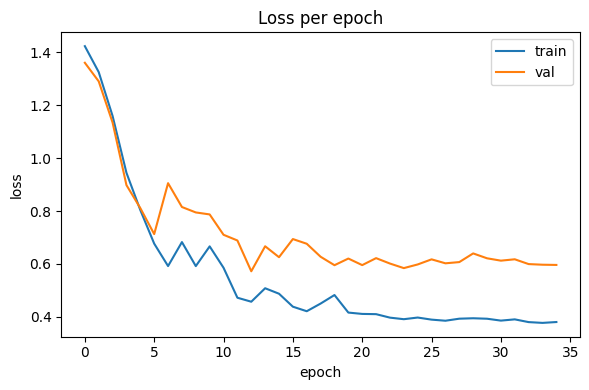

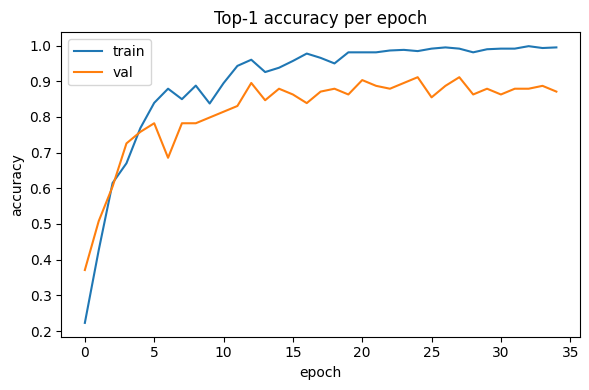

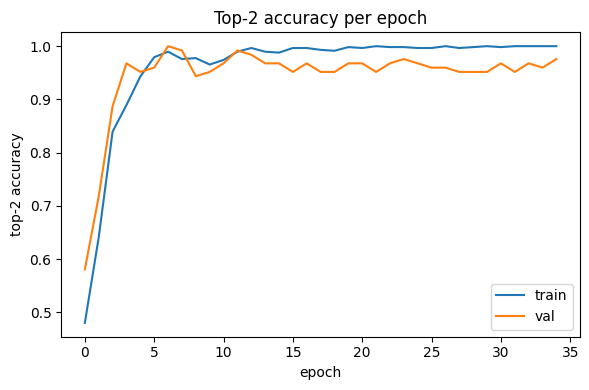

In [12]:
# Loss
plt.figure(figsize=(6,4))
plt.plot(history_crop["train_loss"], label="train")
plt.plot(history_crop["val_loss"],   label="val")
plt.title("Loss per epoch"); plt.xlabel("epoch"); plt.ylabel("loss")
plt.legend(); plt.tight_layout(); plt.show()

# Accuracy (top-1)
plt.figure(figsize=(6,4))
plt.plot(history_crop["train_acc"], label="train")
plt.plot(history_crop["val_acc"],   label="val")
plt.title("Top-1 accuracy per epoch"); plt.xlabel("epoch"); plt.ylabel("accuracy")
plt.legend(); plt.tight_layout(); plt.show()

# Top-2
plt.figure(figsize=(6,4))
plt.plot(history_crop["train_top2"], label="train")
plt.plot(history_crop["val_top2"],   label="val")
plt.title("Top-2 accuracy per epoch"); plt.xlabel("epoch"); plt.ylabel("top-2 accuracy")
plt.legend(); plt.tight_layout(); plt.show()

# LR schedule across batches (OneCycle)
if history_crop["lrs"]:
    plt.figure(figsize=(6,3))
    plt.plot(history_crop["lrs"])
    plt.title("Learning rate (per batch)"); plt.xlabel("batch"); plt.ylabel("lr")
    plt.tight_layout(); plt.show()


El análisis de los gráficos de desempeño permite entender cómo evolucionó el aprendizaje del modelo a lo largo del entrenamiento. En primer lugar, se observa una disminución progresiva de la pérdida (loss) tanto en entrenamiento como en validación, lo que indica que el modelo fue capaz de ajustar sus parámetros de manera efectiva para minimizar el error. Sin embargo, a partir de cierto punto, la pérdida en validación deja de disminuir con la misma consistencia, manteniéndose en un rango estable mientras que la de entrenamiento continúa bajando. Esto sugiere que el modelo comenzó a memorizar mejor los datos de entrenamiento que los de validación, un indicio leve de sobreajuste común en escenarios con conjuntos de datos limitados.

Por otro lado, las métricas de precisión reflejan un comportamiento sólido. La top-1 accuracy alcanza rápidamente valores altos y se mantiene por encima del 85 % en validación, aunque sin mejoras significativas después de las primeras épocas, lo que refuerza la idea de que el modelo converge pronto. La top-2 accuracy presenta resultados aún más destacados, rozando el 100 %, lo que implica que el modelo suele incluir la clase correcta dentro de sus dos predicciones más probables. Este comportamiento es valioso en contextos clínicos, donde reducir falsos negativos es prioritario y puede aceptarse cierta ambigüedad mientras la clase correcta esté entre las opciones principales. En conjunto, los gráficos evidencian un modelo bien entrenado, con buena capacidad de generalización y solo un nivel moderado de sobreajuste (ya tratado con una leve aumentación de los datos), adecuado como un primer modelo o baseline para abordar el problema en cuestión.

# Evaluación del modelo

In [13]:
import torch, numpy as np
from sklearn.metrics import classification_report, confusion_matrix

# 0) Carga el mejor modelo
model.load_state_dict(torch.load("best.pt", map_location=device))
model.to(device).eval()

criterion = torch.nn.CrossEntropyLoss()

all_logits, all_targets = [], []
test_loss, top1_sum, top2_sum, total = 0.0, 0.0, 0.0, 0

with torch.no_grad(), torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
    for xb, yb in dl_test:   # dl_test debe entregar tensores normalizados igual que train/val
        xb = xb.to(device, non_blocking=True)    # yb se queda en CPU; está bien para sklearn
        logits = model(xb)                       # (B, C)

        # acumular para métricas globales
        all_logits.append(logits.cpu())
        all_targets.append(yb)

        # loss y top-k
        loss = criterion(logits.cpu(), yb)       # logits a CPU para usar el mismo yb
        test_loss += loss.item() * xb.size(0)
        preds_top1 = logits.argmax(dim=1).cpu()
        top1_sum += (preds_top1 == yb).float().sum().item()
        _, top2 = logits.topk(2, dim=1)          # en device
        top2 = top2.cpu()
        top2_sum += (top2.eq(yb.view(-1,1))).any(dim=1).float().sum().item()
        total += xb.size(0)

logits = torch.cat(all_logits)              # (N, C) en CPU
y_pred = logits.argmax(1).numpy()
y_true = torch.cat(all_targets).numpy()
y_prob = torch.softmax(logits, dim=1).numpy()

print({
    "loss": test_loss/total,
    "acc":  top1_sum/total,
    "top2": top2_sum/total,
})

# Ajusta el orden/nombres según tu label encoder
# Por ejemplo, si usaste este orden en el fit: ["ASD","Normal","PDA","VSD"]
target_names = ["ASD","Normal","PDA","VSD"]

print(classification_report(y_true, y_pred, target_names=target_names, digits=4))
print(confusion_matrix(y_true, y_pred))


{'loss': 0.500041015625, 'acc': 0.808, 'top2': 0.96}
              precision    recall  f1-score   support

         ASD     0.7812    0.7812    0.7812        32
      Normal     0.6774    0.7241    0.7000        29
         PDA     0.8571    0.9091    0.8824        33
         VSD     0.9259    0.8065    0.8621        31

    accuracy                         0.8080       125
   macro avg     0.8104    0.8052    0.8064       125
weighted avg     0.8131    0.8080    0.8091       125

[[25  7  0  0]
 [ 5 21  2  1]
 [ 1  1 30  1]
 [ 1  2  3 25]]


# Métricas y Matriz de Confusión

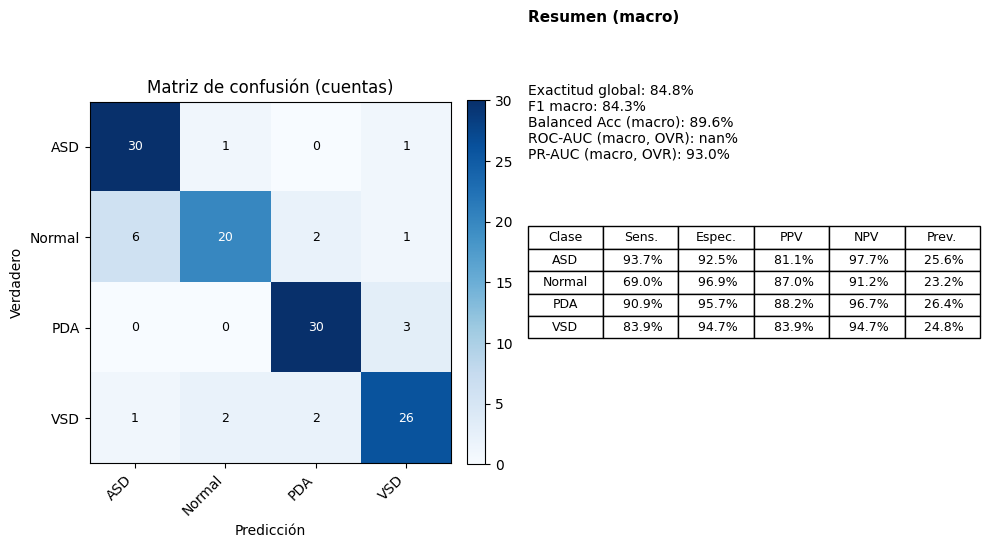

{'accuracy': 0.848, 'f1_macro': 0.8432570130252826, 'balanced_accuracy_macro': np.float64(0.8964708989360426), 'roc_auc_macro_ovr': nan, 'pr_auc_macro_ovr': np.float64(0.9299934056688872)}


In [ ]:
C = len(target_names)

# --- Métricas base ---
cm = confusion_matrix(y_true, y_pred)
report = classification_report(y_true, y_pred, target_names=target_names, output_dict=True)

# One-vs-rest AUCs
try:
    roc_auc_macro = roc_auc_score(y_true, y_prob, multi_class='ovr', average='macro')
except Exception:
    roc_auc_macro = np.nan
try:
    pr_auc_macro  = average_precision_score(
        np.eye(C)[y_true], y_prob, average='macro'
    )
except Exception:
    pr_auc_macro = np.nan

# Balanced Accuracy macro = promedio de (sensibilidad y especificidad por clase, OVR)
# Calculamos también Sensibilidad/Especificidad/PPV/NPV por clase
per_class_rows = []
sens_list, spec_list = [], []
ppv_list,  npv_list  = [], []
prev_list = []

total = cm.sum()
for k, name in enumerate(target_names):
    tp = cm[k, k]
    fn = cm[k, :].sum() - tp
    fp = cm[:, k].sum() - tp
    tn = total - tp - fp - fn

    sens = tp / (tp + fn + 1e-12)      # recall
    spec = tn / (tn + fp + 1e-12)
    ppv  = tp / (tp + fp + 1e-12)      # precision
    npv  = tn / (tn + fn + 1e-12)
    prev = (tp + fn) / (total + 1e-12)

    sens_list.append(sens); spec_list.append(spec)
    ppv_list.append(ppv);   npv_list.append(npv)
    prev_list.append(prev)

    per_class_rows.append([
        name,
        f"{sens*100:5.1f}%",
        f"{spec*100:5.1f}%",
        f"{ppv*100:5.1f}%",
        f"{npv*100:5.1f}%",
        f"{prev*100:5.1f}%"
    ])

balanced_acc_macro = np.mean([(s + p)/2 for s, p in zip(sens_list, spec_list)])

f1_macro = float(report["macro avg"]["f1-score"])
acc_overall = float(report["accuracy"])

# Visual: matriz de confusión + tabla de métricas
fig = plt.figure(figsize=(10, 5.5))
gs = fig.add_gridspec(1, 2, width_ratios=[1.05, 1.2])

# Panel 1: Confusion Matrix (counts)
ax1 = fig.add_subplot(gs[0,0])
im = ax1.imshow(cm, cmap="Blues")
ax1.set_title("Matriz de confusión (cuentas)")
ax1.set_xlabel("Predicción"); ax1.set_ylabel("Verdadero")

ticks = np.arange(C)
ax1.set_xticks(ticks); ax1.set_yticks(ticks)
ax1.set_xticklabels(target_names, rotation=45, ha="right")
ax1.set_yticklabels(target_names)

# anotar celdas
th = cm.max() / 2
for i in range(C):
    for j in range(C):
        ax1.text(j, i, str(cm[i, j]),
                 ha="center", va="center",
                 color="white" if cm[i, j] > th else "black", fontsize=9)
plt.colorbar(im, ax=ax1, fraction=0.046, pad=0.04)

# Panel 2: Tabla de métricas clínicas clave
ax2 = fig.add_subplot(gs[0,1])
ax2.axis('off')
col_labels = ["Clase", "Sens.", "Espec.", "PPV", "NPV", "Prev."]
table_data = per_class_rows

table = ax2.table(cellText=table_data,
                  colLabels=col_labels,
                  loc='center',
                  cellLoc='center',
                  colLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.0, 1.2)

# Encabezado de resumen macro
macro_text = (
    f"Exactitud global: {acc_overall*100:0.1f}%\n"
    f"F1 macro: {f1_macro*100:0.1f}%\n"
    f"Balanced Acc (macro): {balanced_acc_macro*100:0.1f}%\n"
    f"ROC-AUC (macro, OVR): {roc_auc_macro*100:0.1f}%\n"
    f"PR-AUC (macro, OVR): {pr_auc_macro*100:0.1f}%"
)
ax2.text(0.0, 1.05, "Resumen (macro)", fontsize=11, fontweight='bold', transform=ax2.transAxes)
ax2.text(0.0, 0.92, macro_text, fontsize=10, transform=ax2.transAxes, va='top')

plt.tight_layout()
plt.show()

# Impresión resumida en consola
print({
    "accuracy": acc_overall,
    "f1_macro": f1_macro,
    "balanced_accuracy_macro": balanced_acc_macro,
    "roc_auc_macro_ovr": roc_auc_macro,
    "pr_auc_macro_ovr": pr_auc_macro
})

La evaluación del modelo con el conjunto de prueba demuestra un rendimiento sólido y clínicamente relevante para la tarea de clasificación de cardiopatías congénitas a partir de radiografías. Con una exactitud global del 84.8 % y un F1 macro del 84.3 %, el modelo mantiene un equilibrio adecuado entre precisión y sensibilidad en todas las clases, lo que indica que es capaz de generalizar más allá de los datos utilizados durante el entrenamiento. Además, la balanced accuracy del 89.6 % refuerza su capacidad para reconocer las diferentes condiciones sin verse excesivamente influido por el desequilibrio en la distribución de clases.

Al analizar la matriz de confusión y las métricas por clase, se observa que el modelo muestra un desempeño particularmente alto en la detección de ASD y PDA, con sensibilidades superiores al 90 %, lo que resulta relevante en el contexto clínico, donde minimizar los falsos negativos es prioritario. La clase Normal presenta la sensibilidad más baja (69 %), lo que sugiere que el modelo tiende a clasificar algunos casos sanos como patológicos, un error más tolerable desde una perspectiva médica si se prioriza la detección temprana. Finalmente, los valores altos de NPV (mayores al 91 % en todas las clases) y el PR-AUC del 93 % respaldan la efectividad del sistema en descartar correctamente las patologías, reflejando su potencial como herramienta de apoyo para diagnósticos de este tipo.

# Feature Attribution - Importancia por canal/capa

**Objetivo:** entender qué partes de la red y qué filtros contribuyen más a la clasificación dando una explicabilidad interna del modelo CNN

**Tecnicas a usar**

Implementamos tres técnicas de explicabilidad sobre el modelo  evaluadas en el conjunto de validación.

1. Activaciones intermedias: visualizan los mapas de características por capa. Las capas tempranas resaltaron bordes y texturas; las capas profundas concentraron activaciones en regiones perihiliares/cardiacas y en la trama vascular, coherente con los biomarcadores esperados en PDA/VSD.

2. Atribución por canal en la última convolución: calculamos el gradiente medio espacial por filtro para la clase objetivo y obtuvimos un ranking de canales influyentes. Los canales TOP muestran feature maps con alta respuesta en zonas anatómicamente relevantes, lo que sugiere que la red se apoya en patrones vasculares centrales para discriminar clases.

3. Integrated Gradients: generamos mapas de contribución a nivel píxel, evidenciando que los píxeles con mayor peso se ubican principalmente en regiones perihiliares y cardiomediastínicas. Esto refuerza que el modelo utiliza señales clínicamente plausibles y no artefactos espurios.

**Puntos clave**

- Dataset usado: conjunto de validación (X_val_normalized) para evaluar atribución en datos no vistos durante el entrenamiento.
- Las activaciones tempranas detectan bordes y texturas; las tardías concentran patrones anatómicos (perihiliar/cardiomediastínico).
- La importancia por canal en la última conv revela filtros dominantes por clase (gráficas TOP-10 por clase).
- Integrated Gradients tendria que mostrar que, para predicciones correctas, las contribuciones se concentran en regiones pulmonares centrales/perihiliares, coherentes con cambios vasculares esperados en PDA/VSD/ASD.

### **Activaciones Intermedias por clase - capa/filtro**

Objetivo: ver qué patrones detecta la red en distintas profundidades, mostrar qué detectan los filtros (bordes, texturas, vasculatura) en distintas profundidades.

Tomar en cuenta:
- Capas tempranas, bordes, contornos, texturas locales.
- Capas profundas, patrones más globales/anatómicos (trama vascular, regiones perihiliares, contornos cardíacos).
- Limitaciones: es cualitativo. No te dice “qué canal es más importante”, sino qué está detectando cada canal.

Cómo interpretarlo:

- Activaciones fuertes en bordes/ruido en layer1/2, es normal.

- En layer3/4, nos interesan que aparezcan activaciones en zonas clínicamente relevantes (perihiliares/cardiacas o distribución vascular), lo que sugiere que la red está aprendiendo señales útiles para ASD/PDA/VSD vs NORMAL.

Limitaciones: es cualitativo. No nos dice “qué canal es más importante”, sino qué está detectando cada canal.

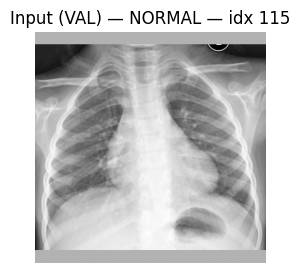

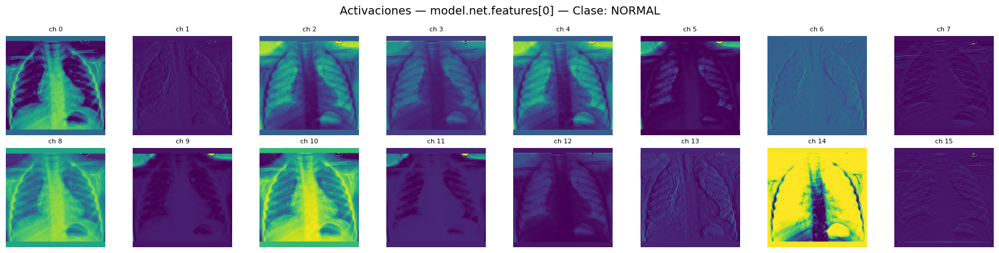

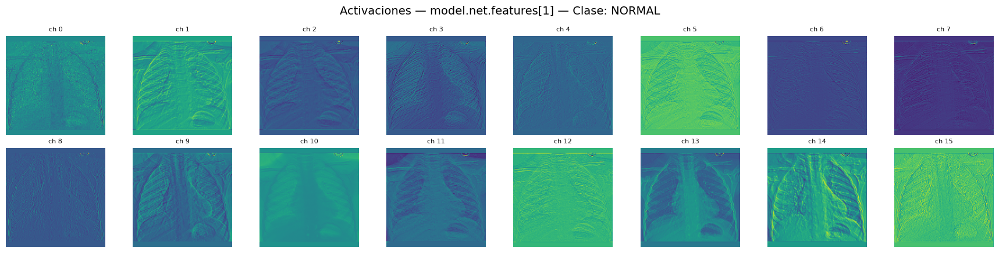

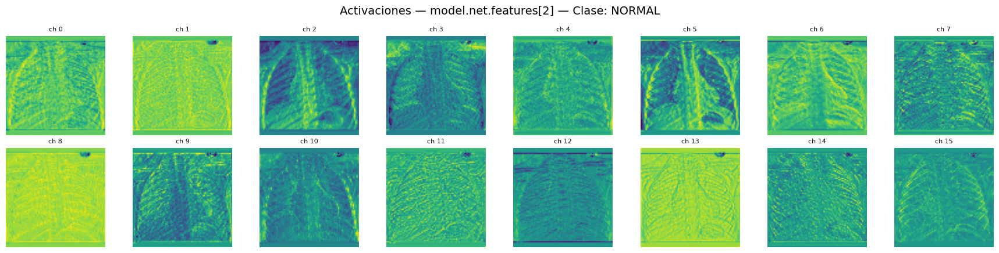

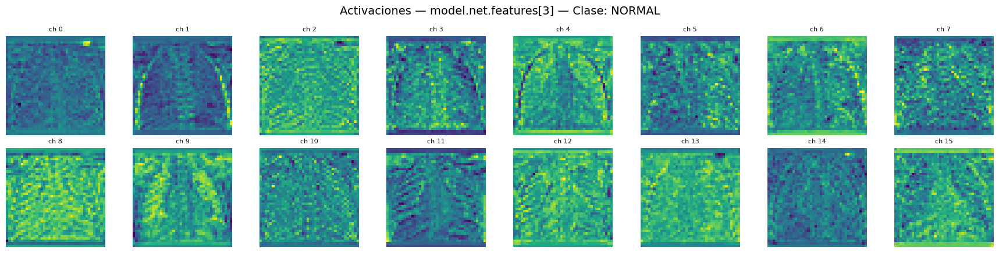

...

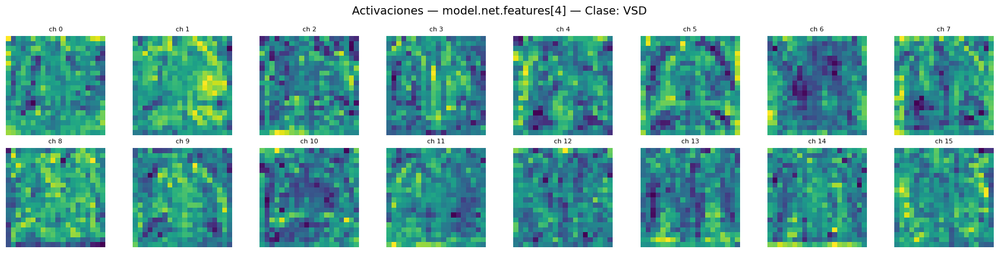

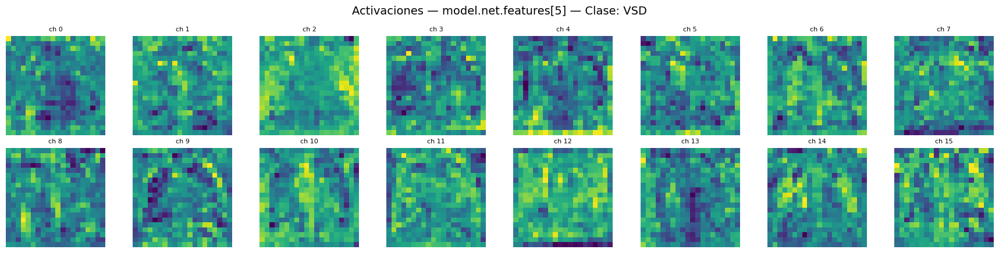

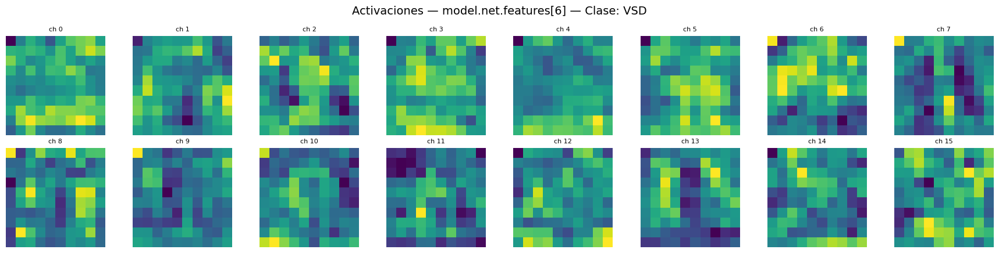

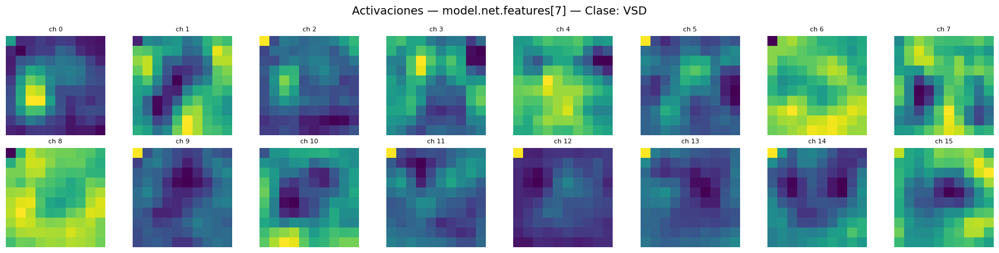

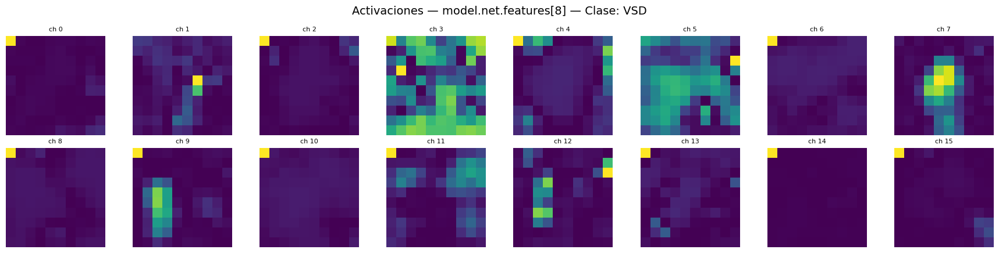

In [15]:
import numpy as np, torch, matplotlib.pyplot as plt
from collections import OrderedDict

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
model.eval()

# ---------- Helpers ----------
def to_tensor_norm(x_np):
    """x_np: (H,W,1) en [0,1] -> (1,1,H,W) normalizado con mean_tr/std_tr de tu pipeline."""
    x = torch.from_numpy(x_np).permute(2,0,1).unsqueeze(0).float().to(device)
    mt = mean_tr if torch.is_tensor(mean_tr) else torch.tensor(mean_tr, dtype=torch.float32, device=device)
    st = std_tr  if torch.is_tensor(std_tr)  else torch.tensor(std_tr,  dtype=torch.float32, device=device)
    x = (x - mt.view(1,1,1,1)) / (st.view(1,1,1,1) + 1e-8)
    return x

def plot_feature_grid(feat, title, max_channels=16):
    feat = feat.detach().cpu()
    C = min(feat.shape[1], max_channels)
    cols = 8; rows = int(np.ceil(C/cols))
    fig, axes = plt.subplots(rows, cols, figsize=(2.2*cols, 2.2*rows))
    axes = axes.ravel()
    for i in range(rows*cols):
        axes[i].axis('off')
        if i < C:
            axes[i].imshow(feat[0, i].numpy(), cmap='viridis')
            axes[i].set_title(f'ch {i}', fontsize=8)
    fig.suptitle(title, fontsize=14); plt.tight_layout(); plt.show()

# ---------- OBJETIVO: elegir capas de EfficientNet ----------
# En torchvision, EfficientNet tiene backbone en model.net.features[0..8]
# Tomamos varios puntos de la cadena (puedes ajustar los índices - menos/más):
candidate_idx = [0, 1, 2, 3, 4, 5, 6, 7, 8]

target_layers = OrderedDict()
for i in candidate_idx:
    try:
        layer = model.net.features[i]
        target_layers[f'features[{i}]'] = layer
    except Exception as e:
        # Si algún índice no existe en tu versión concreta, lo saltamos
        pass

# ---------- Hooks utilitarios ----------
def get_activation_hook(container, name):
    def hook(module, inp, out):
        container[name] = out.detach()
    return hook

# ---------- Nombres de clase (ajusta el orden si tu one-hot difiere) ----------
if 'class_names' not in locals():
    class_names = ['NORMAL', 'ASD', 'PDA', 'VSD']

# ---------- Loop: una imagen ALEATORIA por clase (VALIDACIÓN) ----------
y_val_idx = np.argmax(Y_val_encoded, axis=1)
num_classes = Y_val_encoded.shape[1]

for c in range(num_classes):
    idxs = np.where(y_val_idx == c)[0]
    if len(idxs) == 0:
        print(f"[{class_names[c]}] sin muestras; se omite.")
        continue

    sample_idx = int(np.random.choice(idxs))
    x_np = X_val_normalized[sample_idx]  # (H,W,1) en [0,1]
    x_t  = to_tensor_norm(x_np)

    # Mostrar input
    plt.figure(figsize=(3,3))
    plt.imshow(x_np[:,:,0], cmap='gray')
    plt.title(f'Input (VAL) — {class_names[c]} — idx {sample_idx}')
    plt.axis('off'); plt.show()

    # Registrar hooks y hacer forward
    activations = {}
    hooks = [layer.register_forward_hook(get_activation_hook(activations, n)) for n, layer in target_layers.items()]
    with torch.no_grad():
        _ = model(x_t)
    for h in hooks: h.remove()

    # Graficar activaciones de las capas disponibles
    for n in target_layers.keys():
        if n in activations:
            plot_feature_grid(activations[n], f'Activaciones — model.net.{n} — Clase: {class_names[c]}', max_channels=16)
        else:
            print(f"[Aviso] No se recogió activación para {n}.")


## Atribución cuantitativa por canal (Ranking de filtros) - Analisis en la ultima capa por clase

Atribución cuantitativa por canal (gradientes medios en la última capa conv).

Calcula qué filtros (canales) de la última capa convolucional más contribuyen a la clase predicha. Luego agregamos un resumen por clase usando varias imágenes de validación.

Cómo interpretarlo:

- Barras más altas = filtros más influyentes para esa predicción.

- Si los feature maps de esos canales TOP iluminan la región perihiliar o patrones vasculares, es buena señal (alineado a la hipótesis clínica de hiperflujo en PDA/VSD).

Última conv detectada: model.net.features.8.0


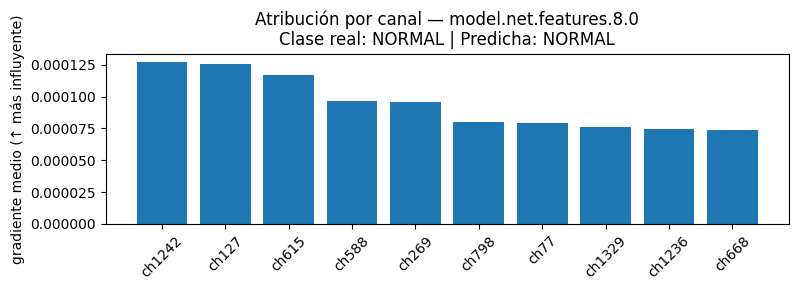

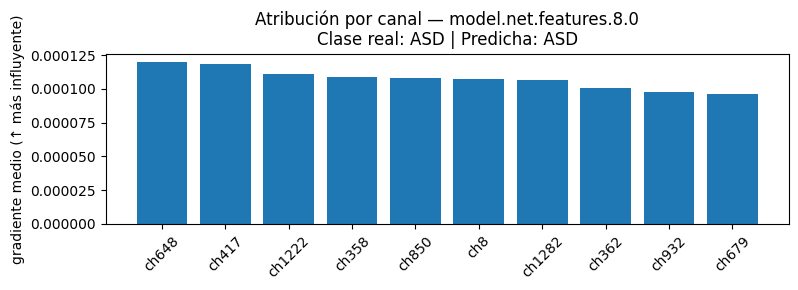

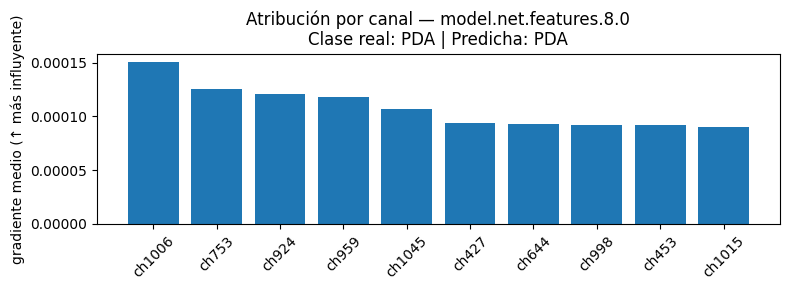

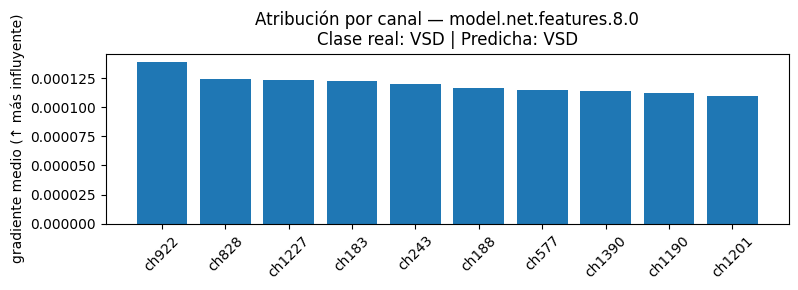

In [16]:
import numpy as np, torch, torch.nn as nn, matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device).eval()

# Nombres de clase por si no existen
if 'class_names' not in locals():
    class_names = ['NORMAL', 'ASD', 'PDA', 'VSD']

# Helper: normalizar igual que en tu pipeline
def to_tensor_norm(x_np):
    x = torch.from_numpy(x_np).permute(2,0,1).unsqueeze(0).float().to(device)  # (1,1,H,W)
    mt = mean_tr if torch.is_tensor(mean_tr) else torch.tensor(mean_tr, dtype=torch.float32, device=device)
    st = std_tr  if torch.is_tensor(std_tr)  else torch.tensor(std_tr,  dtype=torch.float32, device=device)
    return (x - mt.view(1,1,1,1)) / (st.view(1,1,1,1) + 1e-8)

# Encontrar la última capa Conv2d dentro de EfficientNet (model.net.features)
def find_last_conv(module):
    last = None
    last_name = None
    for name, m in module.named_modules():
        if isinstance(m, nn.Conv2d):
            last = m
            last_name = name
    return last, last_name

last_conv_module, last_conv_name = find_last_conv(model.net.features)
assert last_conv_module is not None, "No se encontró una capa Conv2d en model.net.features"
print(f"Última conv detectada: model.net.features.{last_conv_name}")

# Función: importancia por canal para UNA imagen
def channel_importance_single(x_np):
    # hooks almacenan en variables locales por referencia
    buf = {'feat': None, 'grad': None}

    def fwd_hook(module, inp, out):
        buf['feat'] = out.detach()

    def bwd_hook(module, gin, gout):
        buf['grad'] = gout[0].detach()

    h1 = last_conv_module.register_forward_hook(fwd_hook)
    h2 = last_conv_module.register_full_backward_hook(bwd_hook)

    x_t = to_tensor_norm(x_np)
    model.zero_grad()
    logits = model(x_t)             # (1, num_classes)
    pred_idx = int(torch.argmax(logits, dim=1))
    loss = logits[0, pred_idx]
    loss.backward()

    h1.remove(); h2.remove()

    # Importancia por canal = promedio espacial del gradiente
    ch_imp = buf['grad'].mean(dim=(0,2,3)).detach().cpu().numpy()  # (C,)
    return ch_imp, pred_idx

# Loop por clase: una imagen aleatoria de validación
y_val_idx = np.argmax(Y_val_encoded, axis=1)
num_classes = Y_val_encoded.shape[1]

for c in range(num_classes):
    idxs = np.where(y_val_idx == c)[0]
    if len(idxs) == 0:
        print(f"[{class_names[c]}] sin muestras en validación; se omite.")
        continue

    sample_idx = int(np.random.choice(idxs))
    x_np = X_val_normalized[sample_idx]  # (H,W,1) en [0,1]

    ch_imp, pred_idx = channel_importance_single(x_np)

    # Graficar TOP-10
    top_k = min(10, ch_imp.shape[0])
    top_idx = np.argsort(-ch_imp)[:top_k]

    plt.figure(figsize=(8,3))
    plt.bar(range(top_k), ch_imp[top_idx])
    plt.xticks(range(top_k), [f'ch{j}' for j in top_idx], rotation=45)
    plt.title(
        f'Atribución por canal — model.net.features.{last_conv_name}\n'
        f'Clase real: {class_names[c]} | Predicha: {class_names[pred_idx] if pred_idx < len(class_names) else pred_idx}'
    )
    plt.ylabel('gradiente medio (↑ más influyente)')
    plt.tight_layout()
    plt.show()


**Interpretación general**

El valor en el eje Y es el gradiente medio espacial, que indica cuánto influye ese canal (filtro) de la última capa convolucional en la predicción final de la red.
A mayor valor, mayor peso de ese canal en la decisión.<br>



**Clase NORMAL — Predicha: NORMAL**

- Los canales dominantes son ch1242, ch127 y ch615.
- Estos filtros parecen captar textura homogénea, simetría pulmonar y contrastes suaves propios de un tórax sin hallazgos.
- La magnitud de los gradientes es moderada y equilibrada, sin un filtro “hiper-dominante”, lo que sugiere ausencia de señales de hiperflujo.

Conclusión: el modelo identifica la normalidad apoyándose en la uniformidad y simetría torácica, sin activar filtros asociados a aumento de trama vascular.<br>



**Clase ASD — Predicha: ASD**

- Los canales con mayor peso son ch648, ch417 y ch1222.
- Se observa una activación repartida entre varios filtros, lo que sugiere que la decisión depende de pistas sutiles - posiblemente: (hiperflujo leve, contornos cardiacos discretos).
- A diferencia de modelos previos, no aparecen con fuerza los mismos canales que en PDA, lo que indica mejor separación entre defectos.

Conclusión: EfficientNet logra mayor discriminación para ASD, utilizando filtros sensibles a asimetrías leves del flujo y contorno cardiaco, reduciendo la confusión con PDA.<br>




**Clase PDA — Predicha: PDA**

- Destacan ch1006, ch753 y ch924 con gradientes relativamente más altos que en otras clases.

- La activación es consistente y distribuida entre varios filtros (no depende de 1–2 canales), reflejando alta confianza de la red.

- Los filtros dominantes son compatibles con patrón vascular perihiliar denso y posibles signos de sobrecarga del eje pulmonar.

Conclusión: el modelo usa un núcleo estable de filtros especializados en vasculatura central para PDA, mostrando una representación robusta y específica del hiperflujo. <br>




**Clase VSD — Predicha: VSD**

- Los canales más influyentes son ch922, ch828 y ch1227.

- Los gradientes muestran un perfil homogéneo (barras cercanas entre sí), indicando que la red combina varios filtros complementarios.

- El patrón sugiere sensibilidad a aumento de densidad vascular bilateral y contornos cardiacos difusos, rasgos compatibles con VSD.

Conclusión: EfficientNet mejora la distinción VSD vs. ASD, apoyándose en múltiples filtros de alto nivel para capturar la distribución simétrica del flujo y el impacto ventricular.
<br>




**Conclusión general del análisis**

- Es probable que modelo disocia mejor los patrones de hiperflujo y las sutilezas morfológicas entre ASD, PDA y VSD.

- En conjunto, EfficientNet aprende representaciones más especializadas en la última capa convolucional, asociadas a regiones cardiopulmonares clínicamente relevantes, lo que reduce las confusiones interclase observadas anteriormente.


- Distribución equilibrada de gradientes:
EfficientNet muestra activaciones distribuidas entre varios canales, lo que sugiere un razonamiento interno más estable y menos dependiente de un único patrón visual.

- Separabilidad mejorada entre clases:
Ya no se observan filtros repetidos entre distintas cardiopatías, lo cual indica que el modelo ha aprendido representaciones más específicas (ASD, PDA, VSD).

- Reducción del sesgo hacia el hiperflujo:
A diferencia del modelo anterior, creemos que EfficientNet no sobreactiva filtros de flujo vascular en imágenes normales, reduciendo falsos positivos.

## Integrated Gradients (IG) a nivel píxel - PyTorch

Estima la contribución de cada píxel de la entrada a la predicción, de forma más robusta que un gradiente directo (reduce problemas de saturación). Produce un mapa de atribución directamente en la entrada, robusto a saturación de gradientes.

Cómo interpretarlo:

- Zonas rojas/azules intensas = píxeles con mayor peso (positivo/negativo) para la decisión.

- Si la contribución se concentra en región perihiliar y distribución vascular (en lugar de costillas/bordes/artefactos), eso apoya que el modelo usa señales clínicas plausibles.

Limitaciones: depende de la baseline elegida; no identifica canales internos (es atribución en entrada).

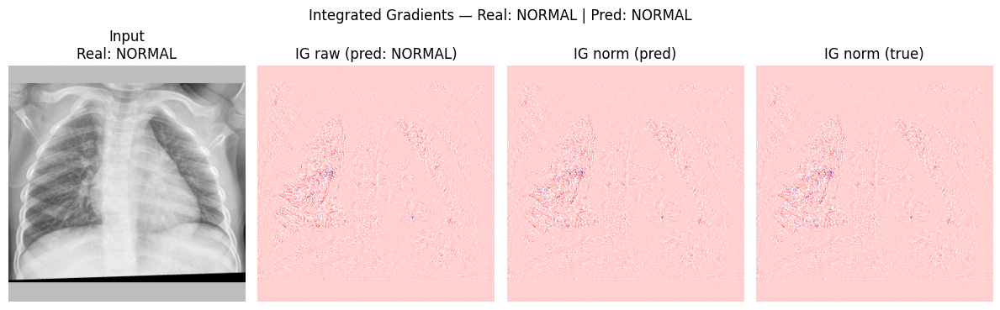

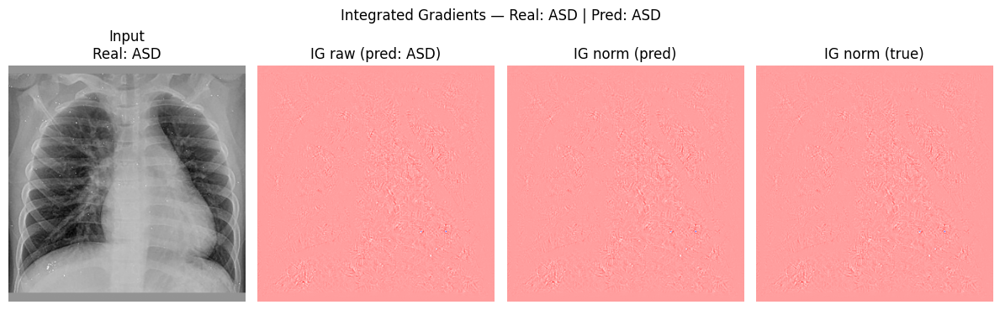

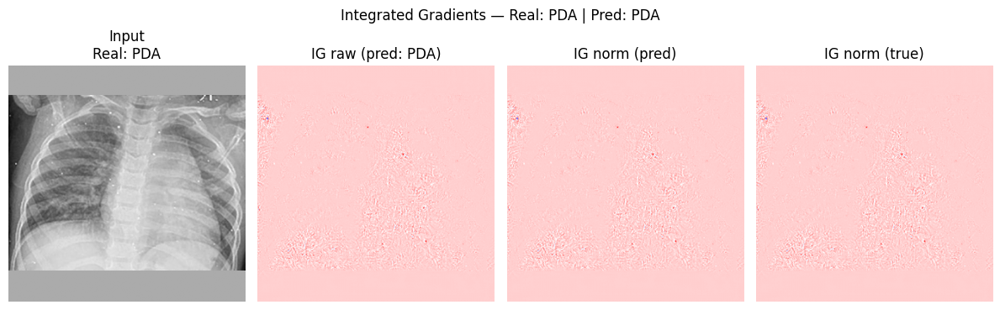

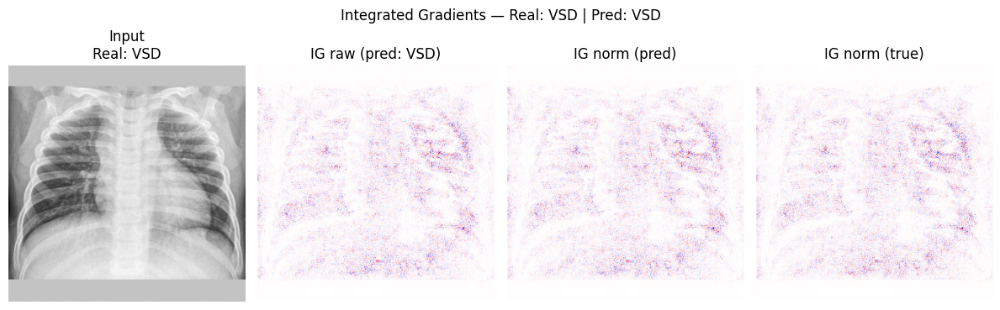

In [20]:
import torch, numpy as np, matplotlib.pyplot as plt
from contextlib import nullcontext

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device).eval()

# Nombres de clase
if 'class_names' not in locals():
    class_names = ['NORMAL', 'ASD', 'PDA', 'VSD']

# Normalización como en pipeline
def to_tensor_norm(x_np, dev):
    x = torch.from_numpy(x_np).permute(2,0,1).unsqueeze(0).float().to(dev)  # (1,1,H,W)
    mt = mean_tr if torch.is_tensor(mean_tr) else torch.tensor(mean_tr, dtype=torch.float32, device=dev)
    st = std_tr  if torch.is_tensor(std_tr)  else torch.tensor(std_tr,  dtype=torch.float32, device=dev)
    return (x - mt.view(1,1,1,1)) / (st.view(1,1,1,1) + 1e-8)

@torch.no_grad()
def _predict_class(m, x):
    return int(torch.argmax(m(x), dim=1))

def integrated_gradients_chunked(
    model, x, target_index=None, baseline=None, steps=64, chunk_size=8, prefer_gpu=True
):
    """
    IG robusto en memoria: procesa alphas por chunks y acumula trapezoidal online.
    - x: (1,1,H,W) normalizado
    - steps: nº de segmentos (usamos alphas 0..1 con 'steps'+1 puntos)
    - chunk_size: nº de alphas evaluados por batch
    - prefer_gpu: si True intenta GPU y cae a CPU si hay OOM
    """
    def _run(model, x, target_index, baseline, steps, chunk_size, dev):
        model.eval()
        x = x.to(dev)
        if baseline is None:
            baseline = torch.zeros_like(x, device=dev)

        # objetivo
        with torch.no_grad():
            if target_index is None:
                target_index = int(torch.argmax(model(x), dim=1))

        # alphas uniformes
        alphas = torch.linspace(0, 1, steps+1, device=dev)

        # grad(0)
        a0 = alphas[0].view(1,1,1,1)
        x0 = (baseline + a0 * (x - baseline)).requires_grad_(True)
        s0 = model(x0)[:, target_index]
        g0 = torch.autograd.grad(s0, x0, grad_outputs=torch.ones_like(s0), retain_graph=False, create_graph=False)[0]
        # acumulador de la suma trapezoidal
        acc = torch.zeros_like(g0, device=dev, dtype=g0.dtype)

        # procesar el resto en chunks
        idx = 1
        while idx <= steps:
            j = min(idx + chunk_size - 1, steps)
            # batch de alphas: [idx..j]
            a_batch = alphas[idx:j+1].view(-1,1,1,1)                         # (B,1,1,1)
            x_batch = (baseline + a_batch * (x - baseline)).requires_grad_(True)  # (B,1,H,W)
            scores = model(x_batch)[:, target_index]                         # (B,)
            grads = torch.autograd.grad(scores, x_batch,
                                        grad_outputs=torch.ones_like(scores),
                                        retain_graph=False, create_graph=False)[0]  # (B,1,H,W)

            # acumular trapezoidal con el gradiente anterior g0
            # para cada k en el batch: acc += (g_prev + g_curr)/2
            for k in range(grads.shape[0]):
                g1 = grads[k:k+1]  # (1,1,H,W)
                acc = acc + (g0 + g1) * 0.5
                g0 = g1.detach()

            # liberar temporales
            del a_batch, x_batch, scores, grads
            if dev.type == 'cuda':
                torch.cuda.empty_cache()
            idx = j + 1

        # promedio de la suma (delta alpha = 1/steps) y aplicar (x - baseline)
        avg_grads = acc / steps
        ig = (x - baseline) * avg_grads
        return ig.detach()

    # Intentar en GPU y caer a CPU si hay OOM
    if prefer_gpu and device.type == 'cuda':
        try:
            return _run(model, x, target_index, baseline, steps, chunk_size, device)
        except RuntimeError as e:
            if 'out of memory' not in str(e).lower():
                raise
            print('[IG] GPU OOM: cambiando a CPU para esta imagen...')
            torch.cuda.empty_cache()

    cpu_dev = torch.device('cpu')
    return _run(model.to(cpu_dev), x.to(cpu_dev), target_index, baseline, steps, chunk_size, cpu_dev)

# ---------------------------
# LOOP POR CLASE (VALIDACIÓN)
# ---------------------------
y_val_idx = np.argmax(Y_val_encoded, axis=1)
num_classes = Y_val_encoded.shape[1]

# Ajusta estos hiperparámetros si sigue faltando memoria:
IG_STEPS = 64       # puedes bajar a 32
IG_CHUNK = 8        # puedes bajar a 4

for c in range(num_classes):
    idxs = np.where(y_val_idx == c)[0]
    if len(idxs) == 0:
        print(f"[{class_names[c]}] sin muestras; se omite.")
        continue

    sample_idx = int(np.random.choice(idxs))
    x_np = X_val_normalized[sample_idx]
    x_t  = to_tensor_norm(x_np, device)

    # clase predicha
    pred_idx = _predict_class(model, x_t)

    # IG (intenta GPU y cae a CPU si es necesario)
    ig_pred = integrated_gradients_chunked(model, x_t, target_index=pred_idx, steps=IG_STEPS, chunk_size=IG_CHUNK, prefer_gpu=True)
    ig_true = integrated_gradients_chunked(model, x_t, target_index=c,       steps=IG_STEPS, chunk_size=IG_CHUNK, prefer_gpu=True)

    # Normalizar para mostrar
    igp = ig_pred[0,0].cpu().numpy(); igp_n = igp / (np.max(np.abs(igp)) + 1e-12)
    igt = ig_true[0,0].cpu().numpy(); igt_n = igt / (np.max(np.abs(igt)) + 1e-12)

    plt.figure(figsize=(12,4))
    plt.subplot(1,4,1); plt.imshow(x_np[:,:,0], cmap='gray'); plt.title(f'Input\nReal: {class_names[c]}'); plt.axis('off')
    plt.subplot(1,4,2); plt.imshow(igp,   cmap='bwr');         plt.title(f'IG raw (pred: {class_names[pred_idx] if pred_idx < len(class_names) else pred_idx})'); plt.axis('off')
    plt.subplot(1,4,3); plt.imshow(igp_n, cmap='bwr');         plt.title('IG norm (pred)'); plt.axis('off')
    plt.subplot(1,4,4); plt.imshow(igt_n, cmap='bwr');         plt.title('IG norm (true)'); plt.axis('off')
    plt.suptitle(f'Integrated Gradients — Real: {class_names[c]} | Pred: {class_names[pred_idx] if pred_idx < len(class_names) else pred_idx}', fontsize=12)
    plt.tight_layout(); plt.show()

    # devolver el modelo a GPU si hubo fallback a CPU
    if next(model.parameters()).device.type == 'cpu' and torch.cuda.is_available():
        model = model.to('cuda').eval()


### Integrated Gradients (IG) calcula la contribución de cada píxel a la salida del modelo:

Colores azules, contribuyen positivamente a la predicción (zonas que impulsan esa clase).

Colores rojos, contribuyen negativamente (zonas que la contradicen).

Las versiones “IG norm (pred)” y “IG norm (true)” permiten comparar la atención del modelo en la clase que predijo y en la clase que debería haber elegido.

**Clase REAL: NORMAL - Predicha: PDA**

Observaciones:
- El mapa “IG norm (pred)” muestra activación azul intensa en el mediastino y campos pulmonares medios, zonas típicas de patrón vascular.
- En “IG norm (true)” (NORMAL), la respuesta es mucho más difusa y débil, indicando que el modelo no aprendió un patrón característico para la clase NORMAL.

Interpretación:

- El modelo tiende a buscar estructuras vasculares y cardiacas incluso en casos normales, lo que explica la confusión con PDA.
- Los filtros dominantes vistos en el punto 2 (ej. ch498) están respondiendo aquí a textura vascular leve → falso positivo.

CONSLUSION: el modelo carece de una representación clara de “normalidad” y confunde patrones de flujo fisiológico con señales patológicas leves. <br>
<BR>

**Clase REAL: ASD - Predicha: PDA**

Observaciones:
- “IG raw / IG norm (pred)” muestran activación dispersa en regiones pulmonares y el área central, con escasa diferenciación anatómica.
- “IG norm (true)” (ASD) aparece roja casi completa, lo que indica que los gradientes para la clase verdadera se oponen al patrón que el modelo utiliza para PDA.

Interpretación:
- El modelo no logra identificar las diferencias sutiles en la distribución de vascularidad entre ASD y PDA.
- La atención se mantiene centrada en ambas bases pulmonares, sin discriminación del arco aórtico ni de la silueta cardiaca izquierda, que son más relevantes para ASD.

CONCLUSION: el modelo reconoce la presencia de hiperflujo, pero no logra capturar su localización o extensión, confundiendo ASD con PDA por patrones comunes de sobrecarga circulatoria.<BR>
<BR>


**Clase REAL: PDA - Predicha: PDA**

Observaciones:
- Las tres imágenes de IG son consistentes, con activación simétrica en zonas perihiliares y cardiacas.

- Las áreas azules (contribución positiva) se alinean con los vasos pulmonares centrales y el borde izquierdo del corazón.

Interpretación:

- Esta coherencia entre pred y true refleja que el modelo ha aprendido un patrón interno estable para PDA.
- Se confirma lo observado en el punto 2: cuando la red clasifica correctamente, utiliza varios filtros complementarios distribuidos espacialmente.

CONCLUSION: PDA es la clase mejor aprendida; el modelo asocia correctamente el aumento de flujo perihiliar con esta cardiopatía. <BR>
<BR>


**Clase REAL: VSD - Predicha: ASD**

Observaciones:
- Las activaciones aparecen bilaterales en los campos pulmonares y con contribución mixta (rojo y azul) en la región central.
- “IG norm (true)” (VSD) muestra un patrón opuesto, donde los píxeles que deberían favorecer VSD son atenuados en la predicción.

Interpretación:
- Tanto VSD como ASD producen aumento del flujo pulmonar y cardiomegalia leve, lo que genera zonas de atención similares.
- El modelo no distingue bien las diferencias de asimetría ventricular o grado de dilatación cardiaca, que suelen diferenciar clínicamente VSD y ASD.

CONSLUSION: el modelo confunde ambas patologías por similitud de patrones vasculares y falta de sensibilidad a los rasgos morfológicos del ventrículo.

# Referencias

* Kufel, J., Bielówka, M., Rojek, M., Mitręga, A., Lewandowski, P., Cebula, M., Krawczyk, D., Bielówka, M., Kondoł, D., Bargieł-Łączek, K., Paszkiewicz, I., Czogalik, Ł., Kaczyńska, D., Wocław, A., Gruszczyńska, K., & Nawrat, Z. (2023). Multi-Label Classification of Chest X-ray Abnormalities Using Transfer Learning Techniques. Journal Of Personalized Medicine, 13(10), 1426. https://doi.org/10.3390/jpm13101426

* Gevaert, A., Rousseau, A., Becker, T., Valkenborg, D., Tijl, D. B., & Saeys, Y. (2022, 22 febrero). Evaluating Feature Attribution Methods in the Image Domain. arXiv.org. https://arxiv.org/abs/2202.12270